## Imports

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as sps

import os
import sys
import gc
from time import time
from functools import partial

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

from statsforecast import StatsForecast
from statsforecast.models import (
    HoltWinters,
    CrostonClassic as Croston, 
    HistoricAverage,
    DynamicOptimizedTheta as DOT,
    SeasonalNaive,
    MSTL,
    SeasonalExponentialSmoothing, ADIDA, ARIMA,
    AutoETS,
    AutoARIMA,
    SklearnModel,
    GARCH, 
    ARCH, 
    Naive,
    ADIDA,
    CrostonClassic, 
    IMAPA, 
    TSB
)
from statsforecast.utils import generate_series, AirPassengers, ConformalIntervals
from statsforecast.feature_engineering import mstl_decomposition

from utilsforecast.losses import mse, rmse, mae, mape, mase, smape
from utilsforecast.plotting import plot_series
from utilsforecast.evaluation import evaluate
from utilsforecast.feature_engineering import pipeline, trend, fourier

from datasetsforecast.m4 import M4, M4Info

In [2]:
sns.set(font_scale=1.2, palette='Set2')

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.labelsize'] = 24
plt.rcParams["figure.figsize"] = (14, 8)

plt.set_cmap('Accent')

<Figure size 1400x800 with 0 Axes>

## Quickstart

In [19]:
df = AirPassengersDF
sf = StatsForecast(
    models=[AutoARIMA(season_length=12)],
    freq='MS',
)

sf.fit(df)
forecast_df = sf.predict(h=12, level=[95])

In [20]:
sf.plot(df, forecast_df, engine='plotly')

## End-to-end walkthrough

In [11]:
Y_df = pd.read_parquet('https://datasets-nixtla.s3.amazonaws.com/m4-hourly.parquet')
Y_df.head()

,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [12]:
print(Y_df.shape)

(373372, 3)


In [13]:
Y_df.unique_id.unique()

array(['H1', 'H10', 'H100', 'H101', 'H102', 'H103', 'H104', 'H105',
       'H106', 'H107', 'H108', 'H109', 'H11', 'H110', 'H111', 'H112',
       'H113', 'H114', 'H115', 'H116', 'H117', 'H118', 'H119', 'H12',
       'H120', 'H121', 'H122', 'H123', 'H124', 'H125', 'H126', 'H127',
       'H128', 'H129', 'H13', 'H130', 'H131', 'H132', 'H133', 'H134',
       'H135', 'H136', 'H137', 'H138', 'H139', 'H14', 'H140', 'H141',
       'H142', 'H143', 'H144', 'H145', 'H146', 'H147', 'H148', 'H149',
       'H15', 'H150', 'H151', 'H152', 'H153', 'H154', 'H155', 'H156',
       'H157', 'H158', 'H159', 'H16', 'H160', 'H161', 'H162', 'H163',
       'H164', 'H165', 'H166', 'H167', 'H168', 'H169', 'H17', 'H170',
       'H171', 'H172', 'H173', 'H174', 'H175', 'H176', 'H177', 'H178',
       'H179', 'H18', 'H180', 'H181', 'H182', 'H183', 'H184', 'H185',
       'H186', 'H187', 'H188', 'H189', 'H19', 'H190', 'H191', 'H192',
       'H193', 'H194', 'H195', 'H196', 'H197', 'H198', 'H199', 'H2',
       'H20', 'H200'

In [15]:
uids = Y_df['unique_id'].unique()[:10] # Select 10 ids to make the example faster
Y_df = Y_df.query('unique_id in @uids')
Y_df = Y_df.groupby('unique_id').tail(7 * 24)

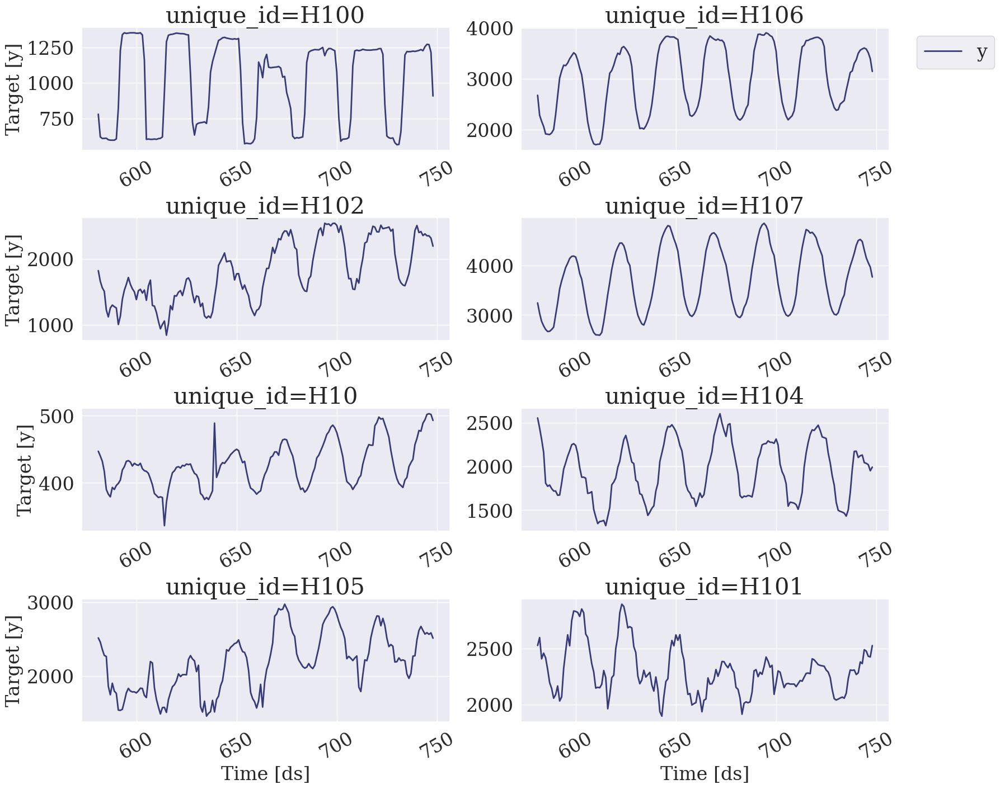

In [22]:
StatsForecast.plot(Y_df)

In [24]:
models = [
    HoltWinters(),
    Croston(),
    SeasonalNaive(season_length=24),
    HistoricAverage(),
    DOT(season_length=24)
]

In [28]:
sf = StatsForecast( 
    models=models,
    freq=1, 
    fallback_model = SeasonalNaive(season_length=7),
    n_jobs=-1,
)

In [29]:
forecasts_df = sf.forecast(df=Y_df, h=48, level=[90])
forecasts_df.head()

,unique_id,ds,HoltWinters,HoltWinters-lo-90,HoltWinters-hi-90,CrostonClassic,CrostonClassic-lo-90,CrostonClassic-hi-90,SeasonalNaive,SeasonalNaive-lo-90,SeasonalNaive-hi-90,HistoricAverage,HistoricAverage-lo-90,HistoricAverage-hi-90,DynamicOptimizedTheta,DynamicOptimizedTheta-lo-90,DynamicOptimizedTheta-hi-90
0,H1,749,829.0,422.549268,1235.450732,829.0,422.549268,1235.450732,635.0,566.036734,703.963266,660.982143,398.037761,923.926524,592.701851,577.677280,611.652639
1,H1,750,807.0,400.549268,1213.450732,807.0,400.549268,1213.450732,572.0,503.036734,640.963266,660.982143,398.037761,923.926524,525.589117,505.449755,546.621805
2,H1,751,785.0,378.549268,1191.450732,785.0,378.549268,1191.450732,532.0,463.036734,600.963266,660.982143,398.037761,923.926524,489.251814,462.072871,512.424116
3,H1,752,756.0,349.549268,1162.450732,756.0,349.549268,1162.450732,493.0,424.036734,561.963266,660.982143,398.037761,923.926524,456.195032,430.554302,478.260963
4,H1,753,719.0,312.549268,1125.450732,719.0,312.549268,1125.450732,477.0,408.036734,545.963266,660.982143,398.037761,923.926524,436.290514,411.051232,461.815932


In [34]:
sf.plot(Y_df,forecasts_df, models=["HoltWinters","DynamicOptimizedTheta", 'SeasonalNaive'], engine='plotly')

Cross-validation

In [35]:
cv_df = sf.cross_validation(
    df=Y_df,
    h=24,
    step_size=24,
    n_windows=2
)

In [36]:
cv_df.head()

,unique_id,ds,cutoff,y,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta
0,H1,701,700,619.0,847.0,742.668748,691.0,661.675,612.767525
1,H1,702,700,565.0,820.0,742.668748,618.0,661.675,536.846296
2,H1,703,700,532.0,790.0,742.668748,563.0,661.675,497.824302
3,H1,704,700,495.0,784.0,742.668748,529.0,661.675,464.723235
4,H1,705,700,481.0,752.0,742.668748,504.0,661.675,440.972351


In [38]:
def evaluate_cv(df, metric):
    models = df.columns.drop(['unique_id', 'ds', 'y', 'cutoff']).tolist()
    evals = metric(df, models=models)
    evals['best_model'] = evals[models].idxmin(axis=1)
    return evals


evaluation_df = evaluate_cv(cv_df, mse)
evaluation_df.head()

,unique_id,HoltWinters,CrostonClassic,SeasonalNaive,HistoricAverage,DynamicOptimizedTheta,best_model
0,H1,44888.020833,28038.733985,1422.666667,20927.664488,1296.333117,DynamicOptimizedTheta
1,H10,2812.916667,1483.483839,96.895833,1980.367543,379.631699,SeasonalNaive
2,H100,121625.375000,91945.139237,12019.000000,78491.191439,21699.646799,SeasonalNaive
3,H101,28453.395833,16183.634340,10944.458333,18208.409800,63698.059884,SeasonalNaive
4,H102,232924.854167,132655.309136,12699.895833,309110.475212,31393.070741,SeasonalNaive


In [42]:
evaluation_df['best_model'].value_counts().to_frame().reset_index()

,best_model,count
0,SeasonalNaive,6
1,DynamicOptimizedTheta,4


In [ ]:
seasonal_ids = evaluation_df.query('best_model == "SeasonalNaive"')['unique_id']
sf.plot(Y_df,forecasts_df, unique_ids=seasonal_ids, models=["SeasonalNaive","DynamicOptimizedTheta"])

In [43]:
def get_best_model_forecast(forecasts_df, evaluation_df):
    with_best = forecasts_df.merge(evaluation_df[['unique_id', 'best_model']])
    res = with_best[['unique_id', 'ds']].copy()
    for suffix in ('', '-lo-90', '-hi-90'):
        res[f'best_model{suffix}'] = with_best.apply(lambda row: row[row['best_model'] + suffix], axis=1)
    return res

In [44]:
prod_forecasts_df = get_best_model_forecast(forecasts_df, evaluation_df)
prod_forecasts_df.head()

,unique_id,ds,best_model,best_model-lo-90,best_model-hi-90
0,H1,749,592.701851,577.677280,611.652639
1,H1,750,525.589117,505.449755,546.621805
2,H1,751,489.251814,462.072871,512.424116
3,H1,752,456.195032,430.554302,478.260963
4,H1,753,436.290514,411.051232,461.815932


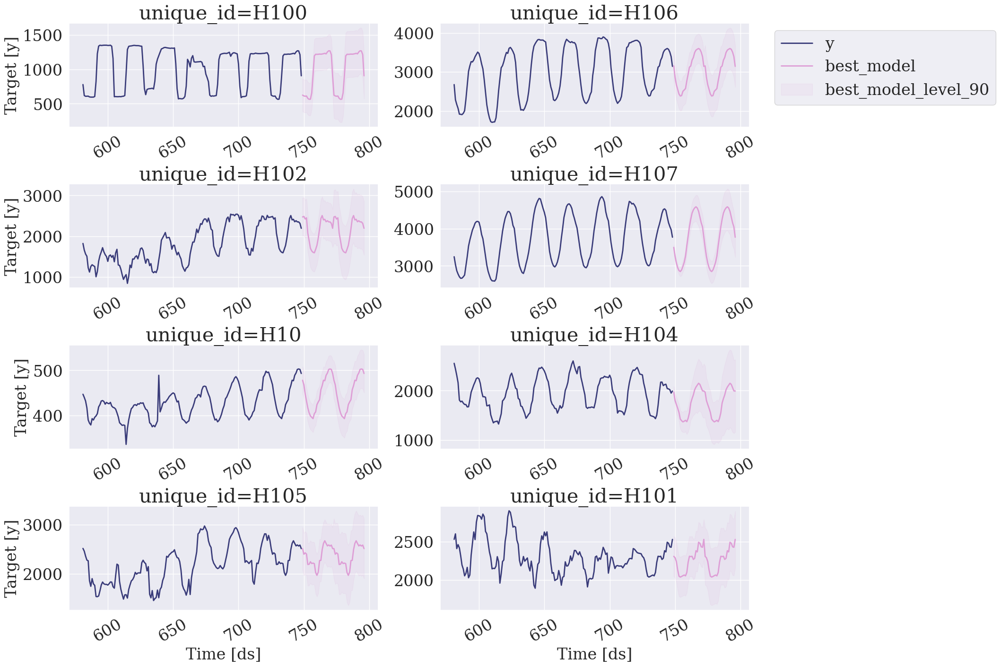

In [45]:
sf.plot(Y_df, prod_forecasts_df, level=[90])

## Anomaly detection

In [46]:
df_total = pd.read_parquet('https://datasets-nixtla.s3.amazonaws.com/m4-hourly.parquet')
df_total.head()

,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [47]:
n_series = 8
uids = df_total['unique_id'].unique()[:n_series]
df = df_total.query('unique_id in @uids')

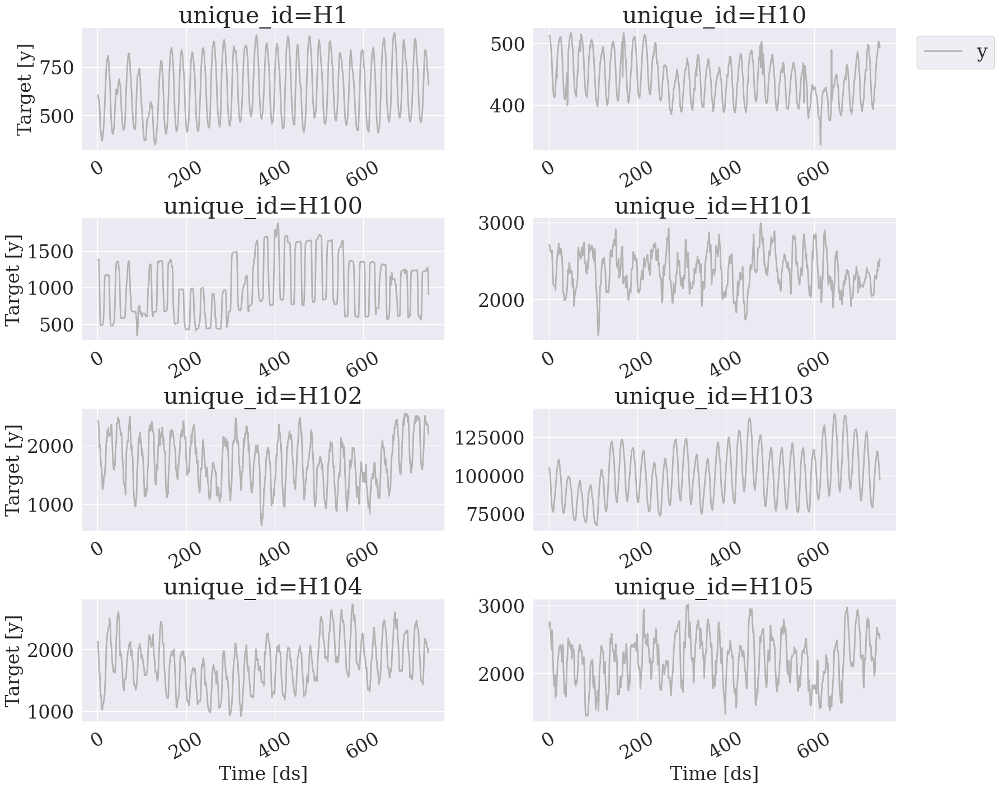

In [50]:
plot_series(df)


In [53]:
models = [MSTL(season_length = [24, 24*7])]

In [54]:
sf = StatsForecast(
    models=models, 
    freq=1,
    n_jobs=-1,
)

In [55]:
horizon = 48
levels = [99] 

fcst = sf.forecast(df=df, h=48, level=levels, fitted=True)
fcst.head()

,unique_id,ds,MSTL,MSTL-lo-99,MSTL-hi-99
0,H1,749,607.607223,587.173250,628.041196
1,H1,750,552.364253,521.069710,583.658796
2,H1,751,506.785334,465.894977,547.675691
3,H1,752,472.906141,423.114088,522.698195
4,H1,753,452.240231,394.064394,510.416067


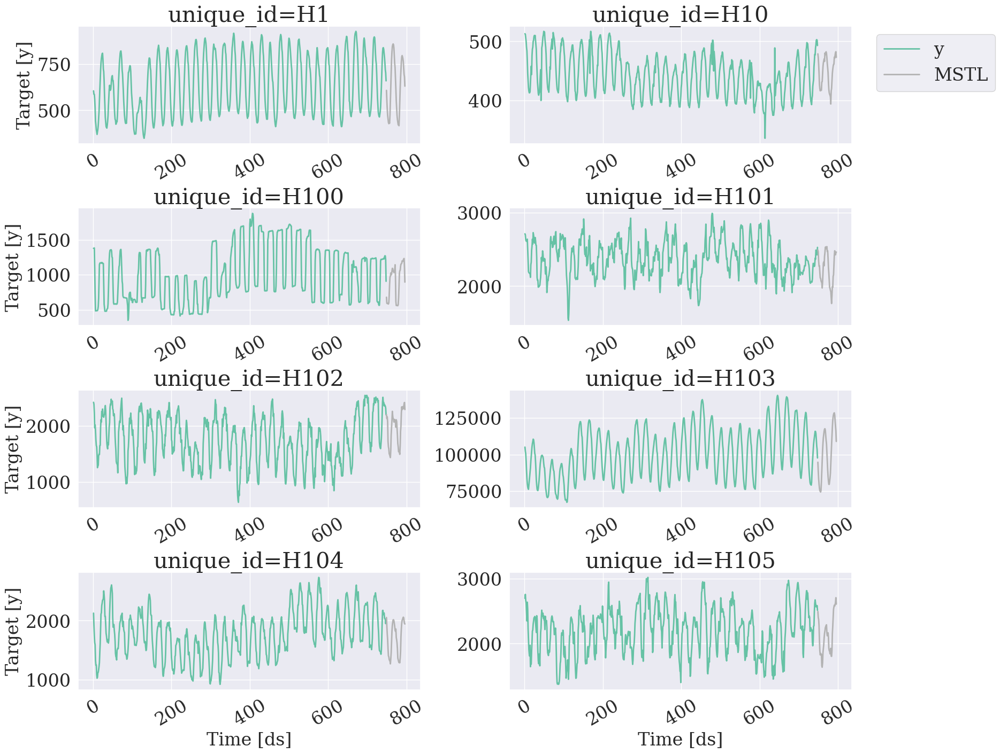

In [56]:
plot_series(df, fcst)


In [57]:
insample_forecasts = sf.forecast_fitted_values()
insample_forecasts.head()

,unique_id,ds,y,MSTL,MSTL-lo-99,MSTL-hi-99
0,H1,1,605.0,605.098607,584.678408,625.518805
1,H1,2,586.0,588.496673,568.076474,608.916872
2,H1,3,586.0,585.586856,565.166657,606.007054
3,H1,4,559.0,554.012377,533.592178,574.432576
4,H1,5,511.0,510.153508,489.733309,530.573707


In [58]:
anomalies = insample_forecasts[~insample_forecasts['y'].between(insample_forecasts['MSTL-lo-99'], insample_forecasts['MSTL-hi-99'])]
anomalies.head()

,unique_id,ds,y,MSTL,MSTL-lo-99,MSTL-hi-99
42,H1,43,613.0,649.404871,628.984672,669.825069
47,H1,48,683.0,662.245526,641.825328,682.665725
48,H1,49,687.0,655.382320,634.962122,675.802519
100,H1,101,507.0,484.934230,464.514031,505.354428
110,H1,111,451.0,474.899006,454.478808,495.319205


In [60]:
anomalies.shape, insample_forecasts.shape

((120, 6), (5984, 6))

In [63]:
plot_series(forecasts_df=insample_forecasts, level=levels, plot_anomalies=True, engine='plotly', ids=['H10'])

## Conformal prediction

In [3]:
train = pd.read_csv('https://auto-arima-results.s3.amazonaws.com/M4-Hourly.csv')
test = pd.read_csv('https://auto-arima-results.s3.amazonaws.com/M4-Hourly-test.csv').rename(columns={'y': 'y_test'})

print(train.shape, test.shape)
train.head()

(353500, 3) (19872, 3)


,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [4]:
n_series = 8 
uids = train['unique_id'].unique()[:n_series] # select first n_series of the dataset
train = train.query('unique_id in @uids')
test = test.query('unique_id in @uids')

gc.collect()

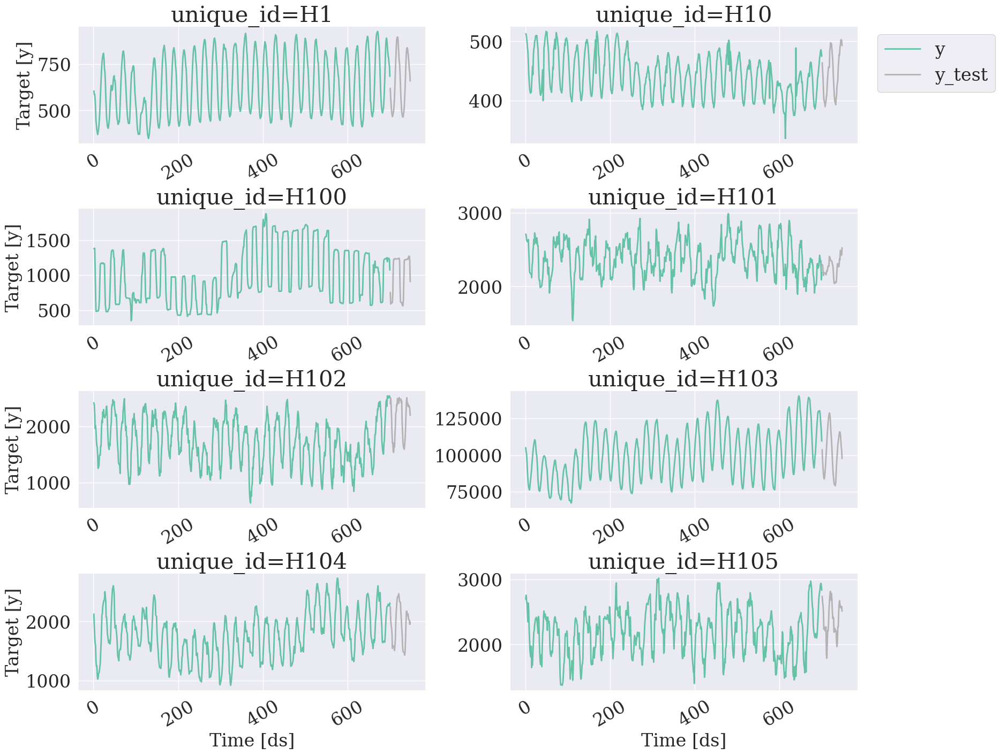

In [6]:
plot_series(train, test, plot_random=False)

In [8]:
# Create a list of models and instantiation parameters 
intervals = ConformalIntervals(h=24, n_windows=2)
# P.S. n_windows*h should be less than the count of data elements in your time series sequence.
# P.S. Also value of n_windows should be atleast 2 or more.

models = [
    SeasonalExponentialSmoothing(season_length=24, alpha=0.1, prediction_intervals=intervals),
    ADIDA(prediction_intervals=intervals),
    ARIMA(order=(24,0,12), prediction_intervals=intervals),
]

In [9]:
sf = StatsForecast(models=models, freq=1, n_jobs=-1)

In [10]:
levels = [80, 90] # confidence levels of the prediction intervals 

forecasts = sf.forecast(df=train, h=24, level=levels)
forecasts.head()

,unique_id,ds,SeasonalES,SeasonalES-lo-90,SeasonalES-lo-80,SeasonalES-hi-80,SeasonalES-hi-90,ADIDA,ADIDA-lo-90,ADIDA-lo-80,ADIDA-hi-80,ADIDA-hi-90,ARIMA,ARIMA-lo-90,ARIMA-lo-80,ARIMA-hi-80,ARIMA-hi-90
0,H1,701,624.132703,553.097423,556.359139,691.906266,695.167983,747.293233,599.519653,600.030880,894.555585,895.066812,618.270938,609.732384,610.778496,625.763380,626.809492
1,H1,702,555.698193,496.653559,506.833156,604.563231,614.742827,747.293233,491.669653,498.330880,996.255585,1002.916812,550.224317,511.054472,515.790938,584.657696,589.394162
2,H1,703,514.403029,462.673117,464.939840,563.866218,566.132941,747.293233,475.105378,475.794151,1018.792314,1019.481087,509.452963,497.820300,498.166996,520.738931,521.085626
3,H1,704,482.057899,433.030711,436.161413,527.954385,531.085087,747.293233,440.069653,440.130880,1054.455585,1054.516812,488.383507,473.188969,473.491999,503.275016,503.578045
4,H1,705,460.222522,414.270186,416.959492,503.485552,506.174858,747.293233,415.805378,416.194151,1078.392314,1078.781087,473.206381,448.165531,449.779127,496.633635,498.247231


In [25]:
ax

<Axes: title={'center': 'unique_id=H105'}, xlabel='Time [ds]', ylabel='Target [y]'>

In [29]:
plot_series(train, forecasts, level=levels, ids=['H105'], models=['SeasonalES'], engine='plotly')

In [31]:
plot_series(train, forecasts, level=levels, ids=['H105'], models=['ADIDA'], engine='plotly')

In [32]:
plot_series(train, forecasts, level=levels, ids=['H105'], models=['ARIMA'], engine='plotly')

## Cross-validation

In [33]:
Y_df = pd.read_parquet('https://datasets-nixtla.s3.amazonaws.com/m4-hourly.parquet') # load the data 
Y_df.head()

,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [34]:
df = Y_df[Y_df['unique_id'] == 'H1']

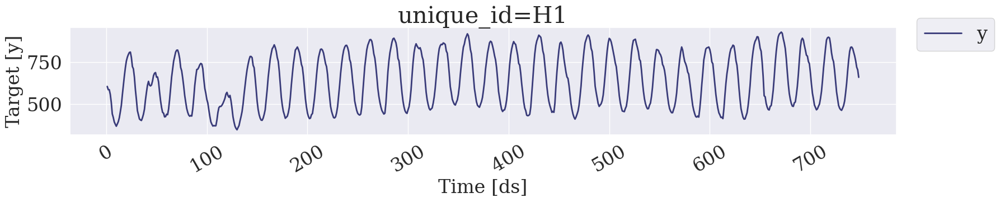

In [35]:
StatsForecast.plot(df)


In [39]:
models = [AutoETS(season_length = 24)]

sf = StatsForecast(
    models = models, 
    freq = 1, 
    n_jobs = 1
)

In [43]:
cv_df = sf.cross_validation(
    df = df,
    h = 24,
    step_size = 24,
    n_windows = 3
)

In [45]:
cv_df

,unique_id,ds,cutoff,y,AutoETS
0,H1,677,676,691.0,677.761053
1,H1,678,676,618.0,607.817879
2,H1,679,676,563.0,569.437729
3,H1,680,676,529.0,537.340007
4,H1,681,676,504.0,515.571123
...,...,...,...,...,...
67,H1,744,724,785.0,844.857371
68,H1,745,724,756.0,814.821630
69,H1,746,724,719.0,778.404604
70,H1,747,724,703.0,759.294872


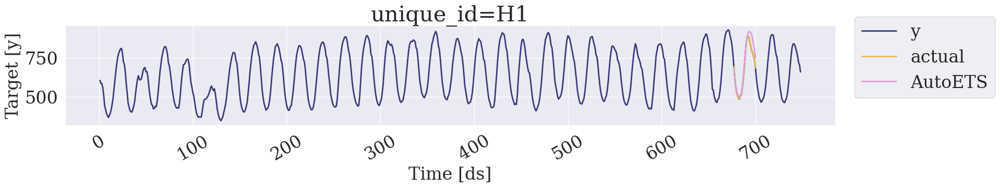

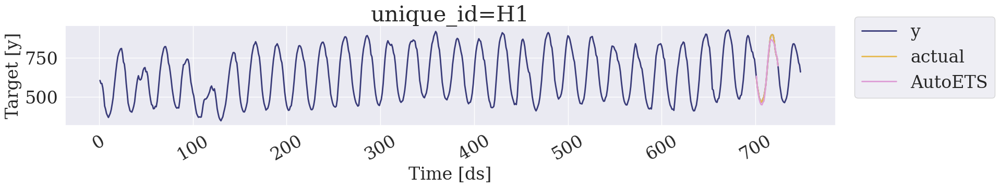

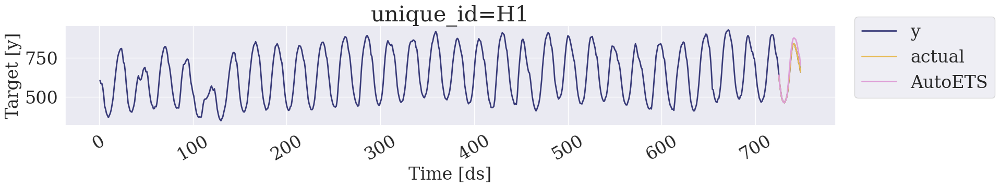

In [46]:
from IPython.display import display


cv_df.rename(columns = {'y' : 'actual'}, inplace = True) # rename actual values 

cutoff = cv_df['cutoff'].unique()

for k in range(len(cutoff)): 
    cv = cv_df[cv_df['cutoff'] == cutoff[k]]
    display(StatsForecast.plot(df, cv.loc[:, cv.columns != 'cutoff']))

In [49]:
cv_rmse = rmse(cv_df, models=['AutoETS'], target_col='actual')['AutoETS'].item()
print(f"RMSE using cross-validation: {cv_rmse:.2f}")

RMSE using cross-validation: 33.90


## Electricity-load forecast

In [51]:
df = pd.read_csv('https://raw.githubusercontent.com/panambY/Hourly_Energy_Consumption/master/data/PJM_Load_hourly.csv')
df.columns = ['ds', 'y']
df.insert(0, 'unique_id', 'PJM_Load_hourly')
df['ds'] = pd.to_datetime(df['ds'])
df = df.sort_values(['unique_id', 'ds']).reset_index(drop=True)
print(df.shape)
df.tail()

(32896, 3)


,unique_id,ds,y
32891,PJM_Load_hourly,2001-12-31 20:00:00,36392.0
32892,PJM_Load_hourly,2001-12-31 21:00:00,35082.0
32893,PJM_Load_hourly,2001-12-31 22:00:00,33890.0
32894,PJM_Load_hourly,2001-12-31 23:00:00,32590.0
32895,PJM_Load_hourly,2002-01-01 00:00:00,31569.0


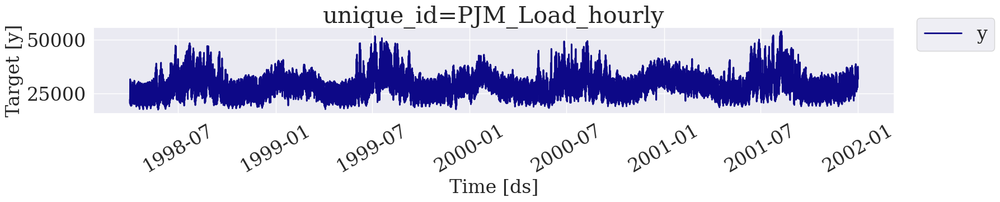

In [61]:
plot_series(df, palette='plasma')

### MSTL model

In [63]:
mstl = MSTL(
    season_length=[24, 24 * 7], # seasonalities of the time series 
    trend_forecaster=AutoARIMA() # model used to forecast trend
)

In [65]:
sf = StatsForecast(
    models=[mstl], # model used to fit each time series 
    freq='h', # frequency of the data
)
sf = sf.fit(df=df)


In [72]:
pred_results = sf.fitted_[0][0].model_
pred_results

,data,trend,seasonal24,seasonal168,remainder
0,22259.0,25899.808157,-4720.213546,581.308595,498.096794
1,21244.0,25900.349395,-5433.168901,571.780657,205.038849
2,20651.0,25900.875973,-5829.135728,557.142643,22.117112
3,20421.0,25901.387631,-5704.092794,597.696957,-373.991794
4,20713.0,25901.884103,-5023.324375,922.564854,-1088.124582
...,...,...,...,...,...
32891,36392.0,33329.031577,4254.112720,917.258336,-2108.402633
32892,35082.0,33355.083576,3625.077164,721.689136,-2619.849876
32893,33890.0,33381.108409,2571.794472,549.661529,-2612.564409
32894,32590.0,33407.105839,796.356548,361.956280,-1975.418667


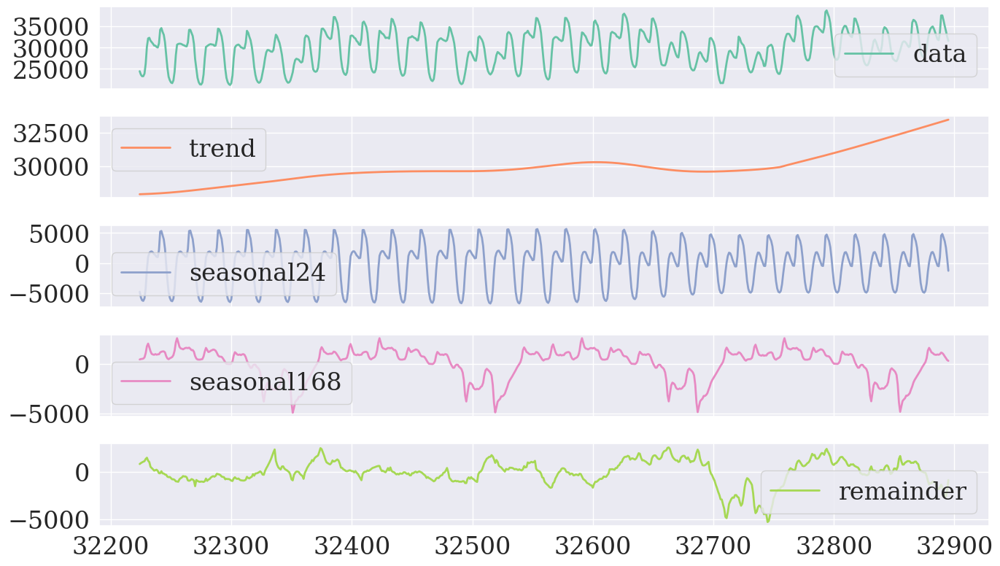

In [70]:
pred_results.tail(24 * 28).plot(subplots=True, grid=True)
plt.tight_layout()
plt.show()

### Model's health check

<Axes: xlabel='remainder', ylabel='Count'>

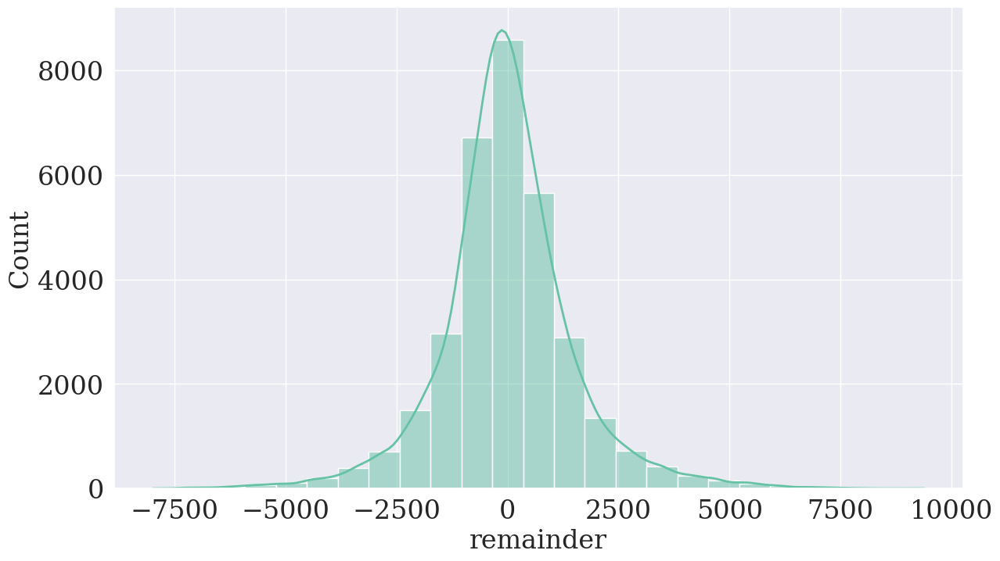

In [74]:
sns.histplot(pred_results['remainder'], kde=True, bins=25)

In [83]:
pred_results['remainder'].describe()[1:]

mean      -1.163595
std     1507.694867
min    -7997.395360
25%     -753.362479
50%      -48.182195
75%      718.997333
max     9396.016586
Name: remainder, dtype: float64

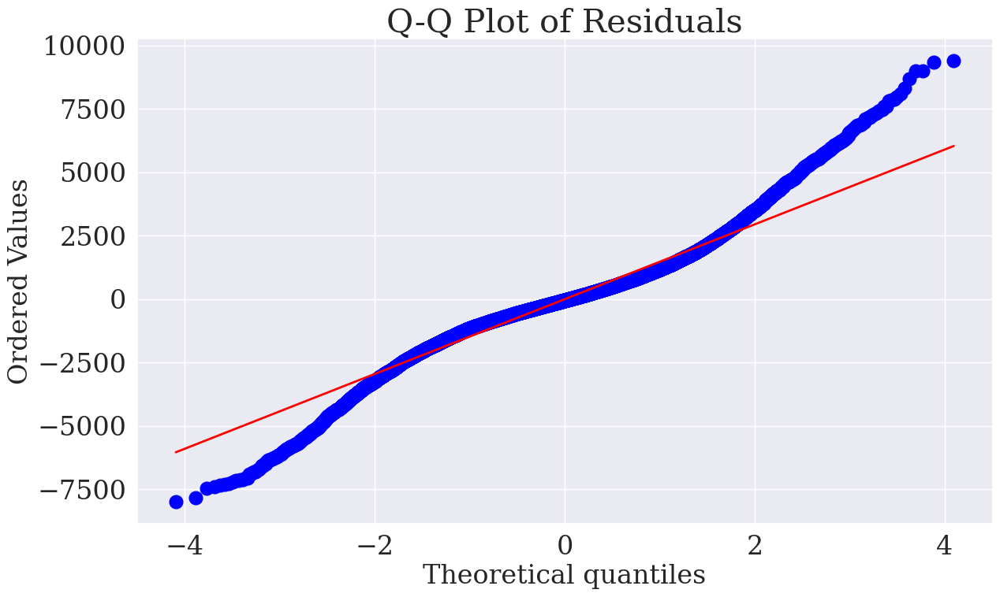

Shapiro-Wilk Test: Statistics=0.9562, p-value=0.0000


/home/eduard/mambaforge/envs/mix/lib/python3.9/site-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 32896.



In [80]:
sps.probplot(pred_results['remainder'], dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.show()

stat, p_value = sps.shapiro(pred_results['remainder'])
print(f"Shapiro-Wilk Test: Statistics={stat:.4f}, p-value={p_value:.4f}")

In [84]:
forecasts = sf.predict(h=24, level=[90])
forecasts.head()

,unique_id,ds,MSTL,MSTL-lo-90,MSTL-hi-90
0,PJM_Load_hourly,2002-01-01 01:00:00,30215.607934,29842.185392,30589.030475
1,PJM_Load_hourly,2002-01-01 02:00:00,29447.208561,28787.122978,30107.294144
2,PJM_Load_hourly,2002-01-01 03:00:00,29132.786856,28221.353868,30044.219844
3,PJM_Load_hourly,2002-01-01 04:00:00,29126.253612,27992.820710,30259.686514
4,PJM_Load_hourly,2002-01-01 05:00:00,29604.607526,28273.427904,30935.787147


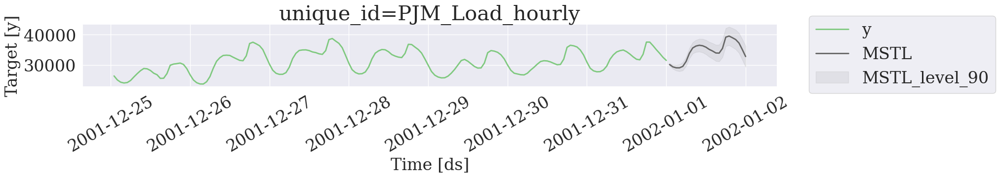

In [88]:
plot_series(df, forecasts, level=[90], max_insample_length=24*7, palette='Accent')

In [89]:
def plot_forecasts_custom(y_hist, y_true, y_pred, models):
    _, ax = plt.subplots(1, 1, figsize = (20, 7))
    y_true = y_true.merge(y_pred, how='left', on=['unique_id', 'ds'])
    df_plot = pd.concat([y_hist, y_true]).set_index('ds').tail(24 * 7)
    df_plot[['y'] + models].plot(ax=ax, linewidth=2)
    colors = ['orange', 'green', 'red']
    for model, color in zip(models, colors):
        ax.fill_between(df_plot.index, 
                        df_plot[f'{model}-lo-90'], 
                        df_plot[f'{model}-hi-90'],
                        alpha=.35,
                        color=color,
                        label=f'{model}-level-90')
    ax.set_title('PJM Load Hourly', fontsize=22)
    ax.set_ylabel('Electricity Load', fontsize=20)
    ax.set_xlabel('Timestamp [t]', fontsize=20)
    ax.legend(prop={'size': 15})
    ax.grid()

### Evaluate model

In [90]:
df_test = df.tail(24)
df_train = df.drop(df_test.index)

sf = StatsForecast(
    models=[mstl, SeasonalNaive(season_length=24)], # add SeasonalNaive model to the list
    freq='h'
)

In [115]:
init = time()
sf = sf.fit(df=df_train)
forecasts_test = sf.predict(h=len(df_test), level=[90])
end = time()

time_mstl = (end - init) / 60
print(f'MSTL Time: {time_mstl:.2f} minutes')
forecasts_test.head()

MSTL Time: 0.18 minutes


,unique_id,ds,MSTL,MSTL-lo-90,MSTL-hi-90,SeasonalNaive,SeasonalNaive-lo-90,SeasonalNaive-hi-90
0,PJM_Load_hourly,2001-12-31 01:00:00,29158.872200,28785.567894,29532.176505,28326.0,23468.555872,33183.444128
1,PJM_Load_hourly,2001-12-31 02:00:00,28233.452136,27573.788941,28893.115330,27362.0,22504.555872,32219.444128
2,PJM_Load_hourly,2001-12-31 03:00:00,27915.251173,27004.458620,28826.043727,27108.0,22250.555872,31965.444128
3,PJM_Load_hourly,2001-12-31 04:00:00,27969.396336,26836.673581,29102.119092,26865.0,22007.555872,31722.444128
4,PJM_Load_hourly,2001-12-31 05:00:00,28469.805352,27139.305650,29800.305055,26808.0,21950.555872,31665.444128


In [97]:
plot_series(df_train, df_test.merge(forecasts_test), level=[90], max_insample_length=24*7, palette='Accent', engine='plotly')


In [100]:
eval_df = evaluate(
    df=df_test.merge(forecasts_test),
    train_df=df_train,
    metrics=[partial(mase, seasonality=24), mae, mape, rmse, smape],
    agg_fn='mean',
).set_index('metric').T
eval_df

metric,mase,mae,mape,rmse,smape
MSTL,0.587265,1219.321573,0.036052,1460.223080,0.017577
SeasonalNaive,0.894653,1857.541667,0.056482,2201.384101,0.029343


### Prophet

In [110]:
from prophet import Prophet


prophet = Prophet(interval_width=0.9)
init = time()
prophet.fit(df_train)
# produce forecasts
future = prophet.make_future_dataframe(periods=len(df_test), freq='H', include_history=False)
forecast_prophet = prophet.predict(future)
end = time()
# data wrangling
forecast_prophet = forecast_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecast_prophet.columns = ['ds', 'Prophet', 'Prophet-lo-90', 'Prophet-hi-90']
forecast_prophet.insert(0, 'unique_id', 'PJM_Load_hourly')

time_prophet = (end - init) / 60
print(f'Prophet Time: {time_prophet:.2f} minutes')
forecast_prophet.head()

12:43:39 - cmdstanpy - INFO - Chain [1] start processing
12:43:52 - cmdstanpy - INFO - Chain [1] done processing


Prophet Time: 0.25 minutes


,unique_id,ds,Prophet,Prophet-lo-90,Prophet-hi-90
0,PJM_Load_hourly,2001-12-31 01:00:00,25294.246960,20755.212375,30094.707082
1,PJM_Load_hourly,2001-12-31 02:00:00,24000.725423,19313.549414,29327.051641
2,PJM_Load_hourly,2001-12-31 03:00:00,23324.771966,18521.567614,28399.416121
3,PJM_Load_hourly,2001-12-31 04:00:00,23332.519871,18933.267433,28397.444966
4,PJM_Load_hourly,2001-12-31 05:00:00,24107.126827,19453.240393,29313.605393


In [117]:
forecasts_test = forecasts_test.merge(forecast_prophet, how='left', on=['unique_id', 'ds'])

In [118]:
plot_series(df_train, forecasts_test, max_insample_length=24*7, level=[90], engine='plotly')

In [119]:
eval_df = evaluate(
    df=df_test.merge(forecasts_test),
    train_df=df_train,
    metrics=[partial(mase, seasonality=24), mae, mape, rmse, smape],
    agg_fn='mean',
).set_index('metric').T
eval_df

metric,mase,mae,mape,rmse,smape
MSTL,0.587265,1219.321573,0.036052,1460.223080,0.017577
SeasonalNaive,0.894653,1857.541667,0.056482,2201.384101,0.029343
Prophet,1.099551,2282.966977,0.073750,2721.817203,0.038633


## Detect demand peaks

In [122]:
Y_df = pd.read_csv('https://datasets-nixtla.s3.amazonaws.com/ERCOT-clean.csv', parse_dates=['ds'])
print(Y_df.shape)
Y_df.head()

(15312, 3)


,unique_id,ds,y
0,ERCOT,2021-01-01 00:00:00,43719.849616
1,ERCOT,2021-01-01 01:00:00,43321.050347
2,ERCOT,2021-01-01 02:00:00,43063.067063
3,ERCOT,2021-01-01 03:00:00,43090.059203
4,ERCOT,2021-01-01 04:00:00,43486.590073


In [124]:
StatsForecast.plot(Y_df, engine='plotly')


In [126]:
train, _ = trend(Y_df, freq='H')
train.head()

,unique_id,ds,y,trend
0,ERCOT,2021-01-01 00:00:00,43719.849616,1.0
1,ERCOT,2021-01-01 01:00:00,43321.050347,2.0
2,ERCOT,2021-01-01 02:00:00,43063.067063,3.0
3,ERCOT,2021-01-01 03:00:00,43090.059203,4.0
4,ERCOT,2021-01-01 04:00:00,43486.590073,5.0


In [129]:
models = [
    MSTL(
        season_length=[24, 24 * 7], # seasonalities of the time series 
        trend_forecaster=SklearnModel(LinearRegression()) # model used to forecast trend
    )
]

sf = StatsForecast(
    models=models,
    freq='H',
    njobs=4
)

cv_df = sf.cross_validation(
    df=train,
    h=24,
    step_size=24,
    n_windows=30
)

In [140]:
npeaks = 3

cv_df = cv_df[['ds','y','MSTL']]
max_day = cv_df.iloc[cv_df['y'].argmax()].ds.day # Day with maximum load
cv_df_day = cv_df.query('ds.dt.day == @max_day')
max_hour = cv_df_day['y'].argmax()
peaks = cv_df_day['MSTL'].argsort().iloc[-npeaks:].values # Predicted peaks

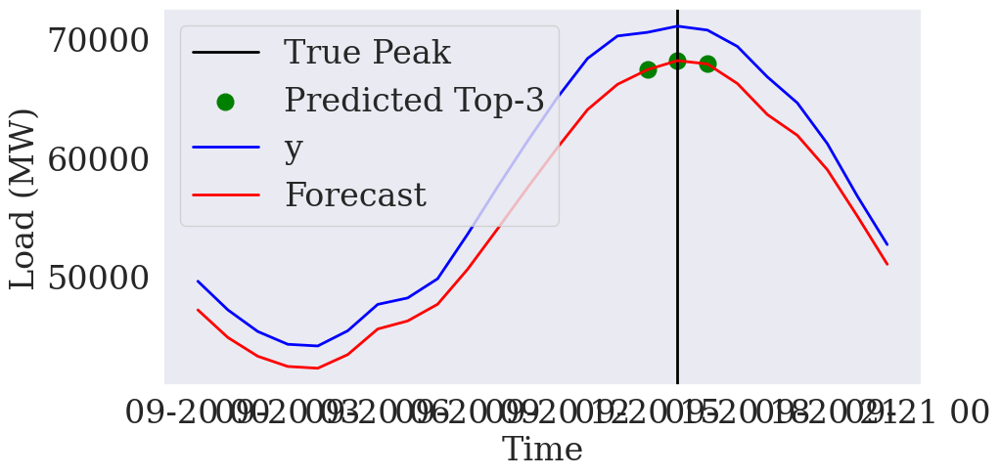

In [141]:
plt.figure(figsize=(10, 5))
plt.axvline(cv_df_day.iloc[max_hour]['ds'], color='black', label='True Peak')
plt.scatter(cv_df_day.iloc[peaks]['ds'], cv_df_day.iloc[peaks]['MSTL'], color='green', label=f'Predicted Top-{npeaks}')
plt.plot(cv_df_day['ds'], cv_df_day['y'], label='y', color='blue')
plt.plot(cv_df_day['ds'], cv_df_day['MSTL'], label='Forecast', color='red')
plt.xlabel('Time')
plt.ylabel('Load (MW)')
plt.grid()
plt.legend()

## Volatility forecasting

In [144]:
import yfinance as yf


tickers = ['SPY', 'MSFT', 'AAPL', 'GOOG', 'AMZN', 'TSLA', 'NVDA', 'META', 'NKE', 'NFLX'] 
df = yf.download(tickers, start = '2018-01-01', end = '2022-12-31', interval='1mo', progress=False) # use monthly prices
print(df.shape)
df.head()

(60, 50)


Price           Close                                                
Ticker           AAPL       AMZN       GOOG        META       MSFT   
Date                                                                 
2018-01-01  39.344826  72.544502  58.221237  186.013306  87.851555  \
2018-02-01  41.856895  75.622498  54.976109  177.483536  86.704964   
2018-03-01  39.587814  72.366997  51.346298  159.040436  84.789757   
2018-04-01  38.993221  78.306503  50.626705  171.193161  86.880013   
2018-05-01  44.092121  81.481003  53.993763  190.880402  91.822296   

Price                                                               ...   
Ticker            NFLX        NKE      NVDA         SPY       TSLA  ...   
Date                                                                ...   
2018-01-01  270.299988  62.702831  6.078020  251.718018  23.620667  ...  \
2018-02-01  291.380005  61.609047  5.984056  242.565445  22.870667  ...   
2018-03-01  295.350006  61.066780  5.730201  234.975494  17.742001  ...   
2018-04-01  312.459991  63.049217  5.564672  237.135880  19.593332  ...   
2018-05-01  351.600006  66.192909  6.239903  242.900436  18.982000  ...   

Price           Volume                                                
Ticker            AAPL        AMZN       GOOG       META       MSFT   
Date                                                                  
2018-01-01  2638717600  1927424000  574768000  495655700  574258400  \
2018-02-01  3711577200  2755680000  847640000  516251600  725663300   
2018-03-01  2854910800  2608002000  907066000  996201700  750754800   
2018-04-01  2664617200  2598392000  834318000  750072700  668130700   
2018-05-01  2483905200  1432310000  636988000  401144100  509417900   

Price                                                                  
Ticker           NFLX        NKE         NVDA         SPY        TSLA  
Date                                                                   
2018-01-01  238377600  157812200  11456216000  1985506700  1864072500  
2018-02-01  184585800  160317000  14915528000  2923722000  1637850000  
2018-03-01  263449400  174066700  14118440000  2323561800  2359027500  
2018-04-01  262006000  158981900  11144008000  1998466500  2854662000  
2018-05-01  142050800  129566300  11978240000  1606397200  2333671500  

[5 rows x 50 columns]

In [150]:
df.columns

MultiIndex([( 'Close', 'AAPL'),
            ( 'Close', 'AMZN'),
            ( 'Close', 'GOOG'),
            ( 'Close', 'META'),
            ( 'Close', 'MSFT'),
            ( 'Close', 'NFLX'),
            ( 'Close',  'NKE'),
            ( 'Close', 'NVDA'),
            ( 'Close',  'SPY'),
            ( 'Close', 'TSLA'),
            (  'High', 'AAPL'),
            (  'High', 'AMZN'),
            (  'High', 'GOOG'),
            (  'High', 'META'),
            (  'High', 'MSFT'),
            (  'High', 'NFLX'),
            (  'High',  'NKE'),
            (  'High', 'NVDA'),
            (  'High',  'SPY'),
            (  'High', 'TSLA'),
            (   'Low', 'AAPL'),
            (   'Low', 'AMZN'),
            (   'Low', 'GOOG'),
            (   'Low', 'META'),
            (   'Low', 'MSFT'),
            (   'Low', 'NFLX'),
            (   'Low',  'NKE'),
            (   'Low', 'NVDA'),
            (   'Low',  'SPY'),
            (   'Low', 'TSLA'),
            (  'Open', 'AAPL'),
        

In [151]:
df = df.loc[:, (['Close'], tickers)]
df.columns = df.columns.droplevel() # drop MultiIndex
df = df.reset_index()
df.head()

Ticker,Date,SPY,MSFT,AAPL,GOOG,AMZN,TSLA,NVDA,META,NKE,NFLX
0,2018-01-01,251.718018,87.851555,39.344826,58.221237,72.544502,23.620667,6.078020,186.013306,62.702831,270.299988
1,2018-02-01,242.565445,86.704964,41.856895,54.976109,75.622498,22.870667,5.984056,177.483536,61.609047,291.380005
2,2018-03-01,234.975494,84.789757,39.587814,51.346298,72.366997,17.742001,5.730201,159.040436,61.066780,295.350006
3,2018-04-01,237.135880,86.880013,38.993221,50.626705,78.306503,19.593332,5.564672,171.193161,63.049217,312.459991
4,2018-05-01,242.900436,91.822296,44.092121,53.993763,81.481003,18.982000,6.239903,190.880402,66.192909,351.600006


In [159]:
prices = df.melt(id_vars = 'Date')
prices = prices.rename(columns={'Date': 'ds', 'Ticker': 'unique_id', 'value': 'y'})
prices = prices[['unique_id', 'ds', 'y']]
prices

,unique_id,ds,y
0,SPY,2018-01-01,251.718018
1,SPY,2018-02-01,242.565445
2,SPY,2018-03-01,234.975494
3,SPY,2018-04-01,237.135880
4,SPY,2018-05-01,242.900436
...,...,...,...
595,NFLX,2022-08-01,223.559998
596,NFLX,2022-09-01,235.440002
597,NFLX,2022-10-01,291.880005
598,NFLX,2022-11-01,305.529999


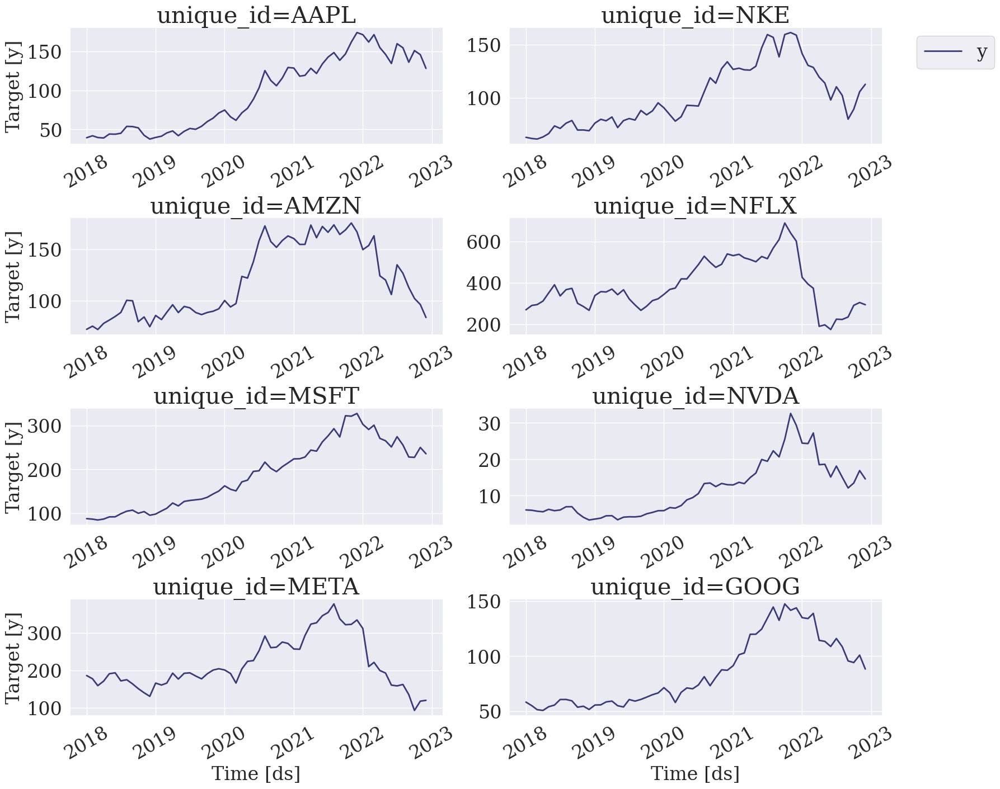

In [160]:
StatsForecast.plot(prices)


In [163]:
prices['rt'] = prices['y'].div(prices.groupby('unique_id')['y'].shift(1))
prices['rt'] = np.log(prices['rt'])

returns = prices[['unique_id', 'ds', 'rt']]
returns = returns.rename(columns={'rt':'y'})
returns

,unique_id,ds,y
0,SPY,2018-01-01,NaN
1,SPY,2018-02-01,-0.037038
2,SPY,2018-03-01,-0.031790
3,SPY,2018-04-01,0.009152
4,SPY,2018-05-01,0.024018
...,...,...,...
595,NFLX,2022-08-01,-0.005976
596,NFLX,2022-09-01,0.051776
597,NFLX,2022-10-01,0.214887
598,NFLX,2022-11-01,0.045705


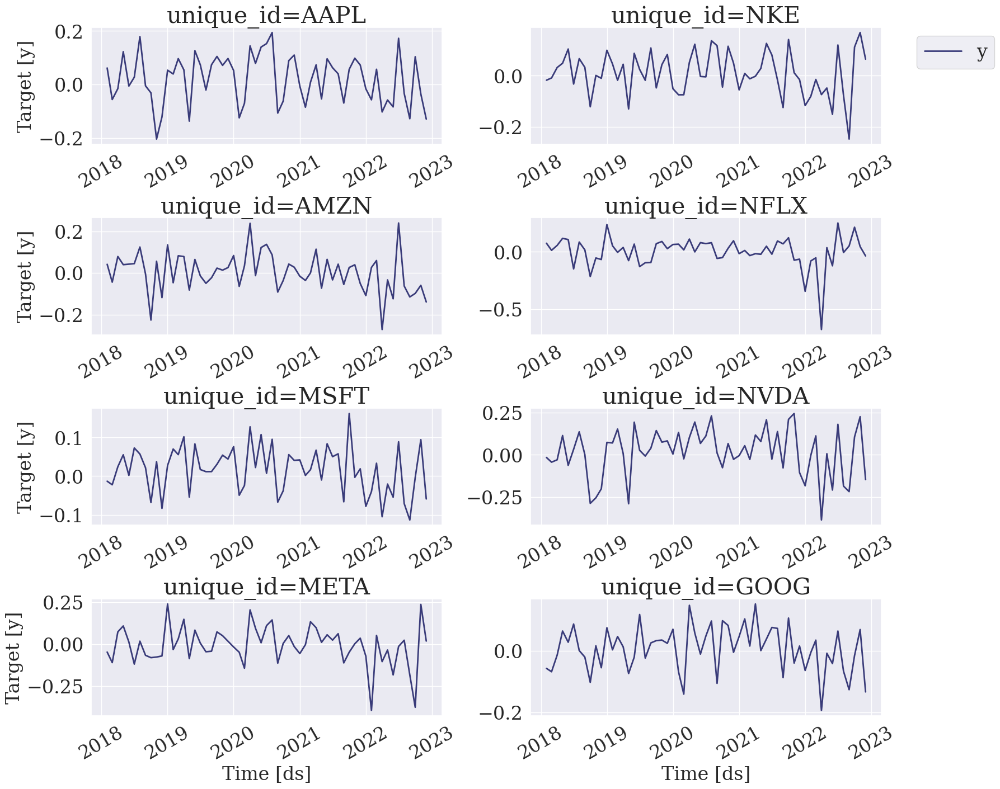

In [164]:
StatsForecast.plot(returns)


In [167]:
models = [
    ARCH(1), 
    ARCH(2), 
    GARCH(1,1),
    GARCH(1,2),
    GARCH(2,2),
    GARCH(2,1),
    Naive()
]

sf = StatsForecast(
    models = models, 
    freq = 'MS',
    n_jobs = -1
)

In [169]:
cv_df = sf.cross_validation(
    df = returns,
    h = 3,
    step_size = 3,
    n_windows = 4
)
cv_df.rename(columns = {'y' : 'actual'}, inplace = True)
cv_df.head()

,unique_id,ds,cutoff,actual,ARCH(1),ARCH(2),"GARCH(1,1)","GARCH(1,2)","GARCH(2,2)","GARCH(2,1)",Naive
0,AAPL,2022-01-01,2021-12-01,-0.015837,0.142418,0.144015,0.212111,0.141685,0.141683,0.144961,0.073061
1,AAPL,2022-02-01,2021-12-01,-0.056856,-0.056893,-0.057156,-0.081416,-0.058787,-0.058787,-0.056949,0.073061
2,AAPL,2022-03-01,2021-12-01,0.057156,-0.045900,-0.046479,-0.069033,-0.045712,-0.045712,-0.047713,0.073061
3,AAPL,2022-04-01,2022-03-01,-0.102178,0.196425,0.212300,0.136208,0.136121,0.136125,0.136544,0.057156
4,AAPL,2022-05-01,2022-03-01,-0.057506,-0.075265,-0.081503,-0.054595,-0.057081,-0.057079,-0.053791,0.057156


In [171]:
StatsForecast.plot(returns, cv_df.drop(['cutoff', 'actual'], axis=1), engine='plotly')


In [172]:
models = cv_df.columns.drop(['unique_id', 'ds', 'cutoff', 'actual'])

mae_cv = mae(cv_df, models=models, target_col='actual').set_index('unique_id')
mae_cv

,ARCH(1),ARCH(2),"GARCH(1,1)","GARCH(1,2)","GARCH(2,2)","GARCH(2,1)",Naive
unique_id,,,,,,,
AAPL,0.073440,0.074755,0.078494,0.069185,0.069188,0.068542,0.110425
AMZN,0.127390,0.113613,0.118859,0.119930,0.109910,0.109910,0.115189
GOOG,0.110702,0.093751,0.093880,0.111346,0.094520,0.118760,0.083233
META,0.198336,0.198894,0.199615,0.209741,0.199711,0.198892,0.185346
MSFT,0.079003,0.076335,0.072242,0.077225,0.073007,0.073006,0.086951
NFLX,0.159386,0.159528,0.199623,0.232477,0.230075,0.230770,0.167421
NKE,0.098644,0.098917,0.103313,0.111196,0.115013,0.105507,0.160405
NVDA,0.189460,0.207873,0.199006,0.197856,0.211915,0.211929,0.215289
SPY,0.058510,0.062227,0.064805,0.072303,0.057052,0.058524,0.089012


In [173]:
mae_cv.idxmin(axis=1)

unique_id
AAPL    GARCH(2,1)
AMZN    GARCH(2,2)
GOOG         Naive
META         Naive
MSFT    GARCH(1,1)
NFLX       ARCH(1)
NKE        ARCH(1)
NVDA       ARCH(1)
SPY     GARCH(2,2)
TSLA    GARCH(1,1)
dtype: object

## Intermittent or Sparse Data


In [176]:
uids = [
    'FOODS_1_001_CA_1',
    'FOODS_1_001_CA_2',
    'FOODS_1_001_CA_3',
    'FOODS_1_001_CA_4',
    'FOODS_1_001_TX_1',
    'FOODS_1_001_TX_2',
    'FOODS_1_001_TX_3',
    'FOODS_1_001_WI_1',
]
df = pd.read_parquet(
    'https://datasets-nixtla.s3.amazonaws.com/m5_y.parquet',
    filters=[('unique_id', 'in', uids)],
)

In [178]:
print(df.shape)
df.head()

(15737, 3)


,unique_id,ds,y
0,FOODS_1_001_CA_1,2011-01-29,3.0
1,FOODS_1_001_CA_1,2011-01-30,0.0
2,FOODS_1_001_CA_1,2011-01-31,0.0
3,FOODS_1_001_CA_1,2011-02-01,1.0
4,FOODS_1_001_CA_1,2011-02-02,4.0


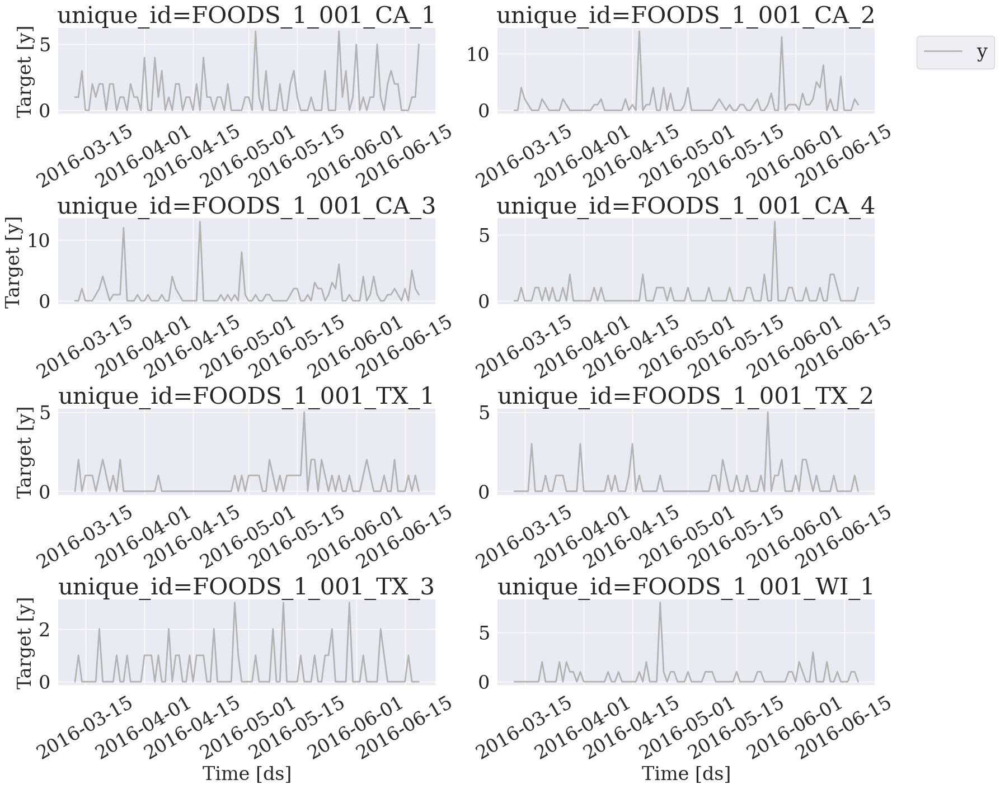

In [179]:
plot_series(df, plot_random=False, max_insample_length=100)

In [180]:
df.groupby('unique_id', observed=True)['y'].median()

unique_id
FOODS_1_001_CA_1    0.0
FOODS_1_001_CA_2    1.0
FOODS_1_001_CA_3    0.0
FOODS_1_001_CA_4    0.0
FOODS_1_001_TX_1    0.0
FOODS_1_001_TX_2    0.0
FOODS_1_001_TX_3    0.0
FOODS_1_001_WI_1    0.0
Name: y, dtype: float32

In [181]:
valid_start = df['ds'].unique()[-28]

train = df[df['ds'] < valid_start]
test = df[df['ds'] >= valid_start]

In [183]:
models = [
    ADIDA(), 
    CrostonClassic(), 
    IMAPA(), 
    TSB(alpha_d = 0.2, alpha_p = 0.2)
]

sf = StatsForecast(
    models=models, 
    freq='D', 
    n_jobs=-1,
)

In [184]:
horizon = 28 
forecasts = sf.forecast(df=train, h=horizon)
forecasts.head()

,unique_id,ds,ADIDA,CrostonClassic,IMAPA,TSB
0,FOODS_1_001_CA_1,2016-05-23,0.791843,0.898247,0.705822,0.434313
1,FOODS_1_001_CA_1,2016-05-24,0.791843,0.898247,0.705822,0.434313
2,FOODS_1_001_CA_1,2016-05-25,0.791843,0.898247,0.705822,0.434313
3,FOODS_1_001_CA_1,2016-05-26,0.791843,0.898247,0.705822,0.434313
4,FOODS_1_001_CA_1,2016-05-27,0.791843,0.898247,0.705822,0.434313


In [185]:
test = test.merge(forecasts, how='left', on=['unique_id', 'ds'])

In [187]:
plot_series(train, test, plot_random=False, max_insample_length=100, engine='plotly')


In [188]:
evaluate(test, metrics=[mae], agg_fn='mean')


,metric,ADIDA,CrostonClassic,IMAPA,TSB
0,mae,0.94873,0.944071,0.957257,1.023126


## MLFlow

In [190]:
series = generate_series(5, min_length=50, max_length=50, equal_ends=True, n_static_features=1)
series.head()

,unique_id,ds,y,static_0
0,0,2000-01-01,12.073897,43
1,0,2000-01-02,59.734166,43
2,0,2000-01-03,101.260794,43
3,0,2000-01-04,143.987430,43
4,0,2000-01-05,185.320406,43


In [192]:
import mlflow
import mlflavors
from mlflavors import statsforecast
import requests

In [206]:
ARTIFACT_PATH = "model"
DATA_PATH = "./data"
HORIZON = 7
LEVEL = [90]

with mlflow.start_run() as run:
    series = generate_series(5, min_length=50, max_length=50, equal_ends=True, n_static_features=1)
    
    train_df = series.groupby('unique_id').head(43)
    test_df = series.groupby('unique_id').tail(7)
    X_test = test_df.drop(columns=["y"])
    y_test = test_df[["y"]]

    models = [AutoARIMA(season_length=7)]

    sf = StatsForecast(models=models, freq="D", n_jobs=-1)

    sf.fit(df=train_df)

    # Evaluate model
    y_pred = sf.predict(h=HORIZON, X_df=X_test, level=LEVEL)["AutoARIMA"]

    metrics = {
        "mae": mean_absolute_error(y_test, y_pred),
        "mape": mean_absolute_percentage_error(y_test, y_pred),
    }

    print(f"Metrics: \n{metrics}")

    # Log metrics
    mlflow.log_metrics(metrics)

    # Log model using pickle serialization (default).
    statsforecast.log_model(
        statsforecast_model=sf,
        artifact_path=ARTIFACT_PATH,
        serialization_format="pickle",
    )
    model_uri = mlflow.get_artifact_uri(ARTIFACT_PATH)

print(f"\nMLflow run id:\n{run.info.run_id}")

Metrics: 
{'mae': 6.7674682366275825, 'mape': 0.12023769634665474}


2025/03/20 13:48:27 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmp8m34hpt_/model/model.pkl, flavor: statsforecast). Fall back to return ['statsforecast==2.0.1']. Set logging level to DEBUG to see the full traceback. 
2025/03/20 13:48:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



MLflow run id:
452571357b004e23acc188337444865c


In [207]:
loaded_model = statsforecast.load_model(model_uri=model_uri)
results = loaded_model.predict(h=HORIZON, X_df=X_test, level=LEVEL)
results.head()

,unique_id,ds,AutoARIMA,AutoARIMA-lo-90,AutoARIMA-hi-90
0,0,2000-02-13,55.894433,44.515008,67.273859
1,0,2000-02-14,97.818054,86.438628,109.197479
2,0,2000-02-15,146.745421,135.365996,158.124846
3,0,2000-02-16,188.888344,177.508918,200.267769
4,0,2000-02-17,231.493638,220.114213,242.873064


### Model Serving

This section illustrates an example of serving the pyfunc flavor to a local REST API endpoint and subsequently requesting a prediction from the served model. To serve the model run the command below where you substitute the run id printed during execution training code.

```bash
mlflow models serve -m runs:/<run_id>/model --env-manager local --host 127.0.0.1
```

After running this, the code below can be ran to send a request.

```python
HORIZON = 7
LEVEL = [90, 95]

# Define local host and endpoint url
host = "127.0.0.1"
url = f"http://{host}:5000/invocations"

# Convert DateTime to string for JSON serialization
X_test_pyfunc = X_test.copy()
X_test_pyfunc["ds"] = X_test_pyfunc["ds"].dt.strftime(date_format="%Y-%m-%d")

# Convert to list for JSON serialization
X_test_list = X_test_pyfunc.to_numpy().tolist()

# Convert index to list of strings for JSON serialization
X_cols = list(X_test.columns)

# Convert dtypes to string for JSON serialization
X_dtypes = [str(dtype) for dtype in list(X_test.dtypes)]

predict_conf = pd.DataFrame(
    [
        {
            "X": X_test_list,
            "X_cols": X_cols,
            "X_dtypes": X_dtypes,
            "h": HORIZON,
            "level": LEVEL,
        }
    ]
)

# Create dictionary with pandas DataFrame in the split orientation
json_data = {"dataframe_split": predict_conf.to_dict(orient="split")}

# Score model
response = requests.post(url, json=json_data)
```

## Generating features

Suppose that you want to use an ARIMA model to forecast your series but you want to incorporate the trend and seasonal components from the MSTL model as external regressors. You can define the MSTL model to use and then provide it to the mstl_decomposition function.

In [209]:
df = pd.read_parquet('https://datasets-nixtla.s3.amazonaws.com/m4-hourly.parquet')
uids = df['unique_id'].unique()[:10]
df = df[df['unique_id'].isin(uids)]
print(df.shape)
df.head()

(7480, 3)


,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


In [210]:
freq = 1
season_length = 24
horizon = 2 * season_length
valid = df.groupby('unique_id').tail(horizon)
train = df.drop(valid.index)
model = MSTL(season_length=24)
transformed_df, X_df = mstl_decomposition(train, model=model, freq=freq, h=horizon)

In [216]:
print(transformed_df.shape)
transformed_df.head()

(7000, 5)


,unique_id,ds,y,trend,seasonal
0,H1,1,605.0,502.872910,131.419934
1,H1,2,586.0,507.873456,93.100015
2,H1,3,586.0,512.822533,82.155386
3,H1,4,559.0,517.717481,42.412749
4,H1,5,511.0,522.555849,-11.401890


In [217]:
print(X_df.shape)
X_df.head()

(480, 4)


,unique_id,ds,trend,seasonal
0,H1,701,643.801348,-29.189627
1,H1,702,644.328207,-99.680432
2,H1,703,644.749693,-141.169014
3,H1,704,645.086883,-173.325625
4,H1,705,645.356634,-195.862530


We can now train our ARIMA models and compute our forecasts.




In [218]:
sf = StatsForecast(
    models=[ARIMA(order=(1, 0, 1), season_length=season_length)],
    freq=freq
)
preds = sf.forecast(h=horizon, df=transformed_df, X_df=X_df)
preds.head()

,unique_id,ds,ARIMA
0,H1,701,612.737692
1,H1,702,542.851746
2,H1,703,501.931726
3,H1,704,470.248124
4,H1,705,448.115631


In [219]:
def compute_evaluation(preds):
    full = preds.merge(valid, on=['unique_id', 'ds'])
    mase24 = partial(mase, seasonality=24)
    res = evaluate(full, metrics=[smape, mase24], train_df=train).groupby('metric')['ARIMA'].mean()
    res_smape = '{:.1%}'.format(res['smape'])
    res_mase = '{:.1f}'.format(res['mase'])
    return pd.Series({'mase': res_mase, 'smape': res_smape})

In [220]:
compute_evaluation(preds)

mase      1.0
smape    3.9%
dtype: object

In [221]:
preds_noexog = sf.forecast(h=horizon, df=train)
compute_evaluation(preds_noexog)

mase      2.3
smape    7.7%
dtype: object

## Sklearn models

In [23]:
group = 'Hourly'
season_length = M4Info[group].seasonality
horizon = M4Info[group].horizon
data, *_ = M4.load('data', group)
data['ds'] = data['ds'].astype('int64')
valid = data.groupby('unique_id').tail(horizon).copy()
train = data.drop(valid.index)
print(train.shape)
train.head()

(353500, 3)


,unique_id,ds,y
0,H1,1,605.0
1,H1,2,586.0
2,H1,3,586.0
3,H1,4,559.0
4,H1,5,511.0


Generate features

In [24]:
train_features, valid_features = pipeline(
    train,
    features=[
        trend,        
        partial(fourier, season_length=season_length, k=10),  # 10 fourier terms
    ],
    freq=1,
    h=horizon,
)
train_features.head()

,unique_id,ds,y,trend,sin1_24,sin2_24,sin3_24,sin4_24,sin5_24,sin6_24,...,cos1_24,cos2_24,cos3_24,cos4_24,cos5_24,cos6_24,cos7_24,cos8_24,cos9_24,cos10_24
0,H1,1,605.0,261.0,-0.707105,-1.000000,-0.707108,-0.000012,0.707112,1.000000,...,0.707109,0.000006,-0.707106,-1.000000,-0.707101,-0.000003,0.707119,1.000000,0.707088,-0.000015
1,H1,2,586.0,262.0,-0.500001,-0.866027,-1.000000,-0.866023,-0.499988,-0.000007,...,0.866025,0.499998,0.000004,-0.500005,-0.866032,-1.000000,-0.866025,-0.499991,0.000019,0.500025
2,H1,3,586.0,263.0,-0.258817,-0.499997,-0.707103,-0.866021,-0.965931,-1.000000,...,0.965926,0.866027,0.707111,0.500007,0.258799,0.000012,-0.258835,-0.499986,-0.707116,-0.866046
3,H1,4,559.0,264.0,0.000005,0.000011,0.000008,0.000021,0.000003,0.000016,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
4,H1,5,511.0,265.0,0.258820,0.500002,0.707114,0.866027,0.965925,1.000000,...,0.965926,0.866024,0.707099,0.499997,0.258822,-0.000021,-0.258803,-0.500006,-0.707107,-0.866022


Forecast

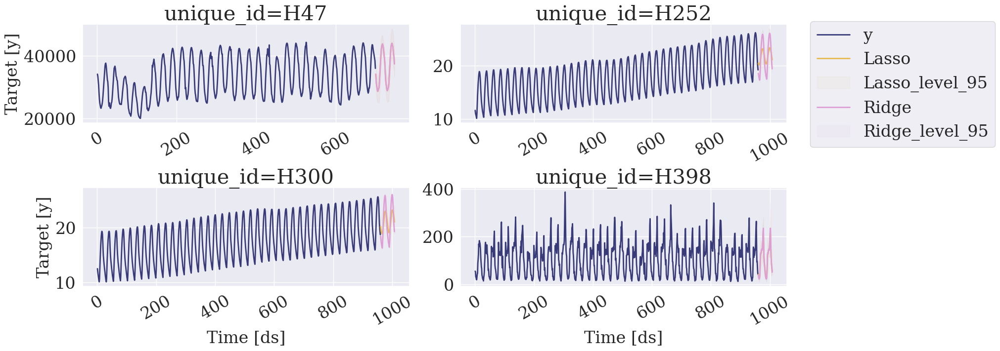

In [28]:
sf = StatsForecast(
    models=[
        SklearnModel(Lasso()),
        SklearnModel(Ridge()),
    ],
    freq=1,
)
preds = sf.forecast(
    df=train_features,
    h=horizon,
    X_df=valid_features,
    prediction_intervals=ConformalIntervals(n_windows=4, h=horizon),
    level=[95],
)
plot_series(train, preds, level=[95], palette='tab20b', max_ids=4)